<a href="https://colab.research.google.com/github/minoxd/fiber_optic_box_inspection/blob/main/yolo_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from pathlib import Path
print(Path('/content/drive/MyDrive/fiber_optic_box_inspection/dataset_v2_ALL/processed_dataset.tar.gz').exists())

True


# Environmental Setup

## mount gdrive, import libraries, declare constants, specify paths

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
from pathlib import Path
import shutil
import tarfile
import torch
import pickle

if Path('/content/sample_data').exists():
    shutil.rmtree('/content/sample_data')

In [ ]:
IMGSZ = 960

These files are required in the `Data_INF` folder:
- data_label_All.tar.gz
- inf_raw_classes_v1.0.json
- matching_name_id_v1.0.xlsx

In [ ]:
BASE_DIR = '/content/drive/MyDrive/fiber_optic_box_inspection'
if not Path(BASE_DIR).exists():
    raise FileNotFoundError(f'Base directory {BASE_DIR} not found. Check Google Drive mount.')

LOCAL_BASE_DIR = '/content'

paths = {
    'base_dir':                                   Path(BASE_DIR),
    'dataset_dir':                                Path(BASE_DIR, 'dataset_v2_ALL'),
    'yolo_output_dir':                            Path(BASE_DIR, 'runs_yolo'),
}

paths['processed_dataset_compressed'] =           Path(paths['dataset_dir'], 'processed_dataset.tar.gz')

local_paths = {
    'base_dir':                                   Path(LOCAL_BASE_DIR),
    'dataset_dir':                                Path(LOCAL_BASE_DIR, 'dataset_v2_ALL'),
}

if not local_paths['dataset_dir'].exists():
    Path.mkdir(local_paths['dataset_dir'])

local_paths['yolo_data_cfg_P00'] =                Path(local_paths['dataset_dir'], 'yolo_data_cfg_P00.yaml')
local_paths['yolo_data_cfg_P25'] =                Path(local_paths['dataset_dir'], 'yolo_data_cfg_P25.yaml')
local_paths['yolo_data_cfg_P30'] =                Path(local_paths['dataset_dir'], 'yolo_data_cfg_P30.yaml')
local_paths['yolo_data_cfg_P35'] =                Path(local_paths['dataset_dir'], 'yolo_data_cfg_P35.yaml')
local_paths['yolo_data_cfg_P40'] =                Path(local_paths['dataset_dir'], 'yolo_data_cfg_P40.yaml')

local_paths['yolo_data_cfg_P40_aug_1'] =          Path(local_paths['dataset_dir'], 'yolo_data_cfg_P40_aug_1.yaml')
local_paths['yolo_data_cfg_P40_aug_2'] =          Path(local_paths['dataset_dir'], 'yolo_data_cfg_P40_aug_2.yaml')
local_paths['yolo_data_cfg_P40_aug_3'] =          Path(local_paths['dataset_dir'], 'yolo_data_cfg_P40_aug_3.yaml')
local_paths['yolo_data_cfg_P40_aug_4'] =          Path(local_paths['dataset_dir'], 'yolo_data_cfg_P40_aug_4.yaml')

## install ultralytics

In [ ]:
!pip install ultralytics
from ultralytics import YOLO

## utils

In [ ]:
class Run():
    def __init__(self, run_name, project):
        self.train_run_name = f'train_{run_name}'
        self.val_run_name = f'val_{run_name}'
        self.train_path = Path(project, self.train_run_name)
        self.val_path = Path(project, self.val_run_name)
        self.__best_weight_path = Path(self.train_path, 'weights', 'best.pt')
        self.__last_weight_path = Path(self.train_path, 'weights', 'last.pt')

    def get_best_weight_path(self):
        if self.train_path.is_dir():
            return self.__best_weight_path
        else:
            raise FileNotFoundError(f'The run {self.train_run_name} does not exist.')

    def get_last_weight_path(self):
        if self.train_path.is_dir():
            return self.__last_weight_path
        else:
            raise FileNotFoundError(f'The run {self.train_run_name} does not exist.')

## define runs

In [ ]:
yolo_default_augmentations_P00 = Run('default_augmentations_P00_', paths['yolo_output_dir'])
yolo_default_augmentations_P25 = Run('default_augmentations_P25_', paths['yolo_output_dir'])
yolo_default_augmentations_P30 = Run('default_augmentations_P30_', paths['yolo_output_dir'])
yolo_default_augmentations_P35 = Run('default_augmentations_P35_', paths['yolo_output_dir'])
yolo_default_augmentations_P40 = Run('default_augmentations_P40_', paths['yolo_output_dir'])
yolo_no_augmentations_P40 = Run('no_augmentations_P40_', paths['yolo_output_dir'])
yolo_aug_1_P40 = Run('aug_1_P40_', paths['yolo_output_dir'])
yolo_aug_2_P40 = Run('aug_2_P40_', paths['yolo_output_dir'])
yolo_aug_3_P40 = Run('aug_3_P40_', paths['yolo_output_dir'])
yolo_aug_4_P40 = Run('aug_4_P40_', paths['yolo_output_dir'])

# Get dataset

In [ ]:
!rm -rf /content/dataset_v2_ALL/

In [ ]:
shutil.copytree(paths['dataset_dir'], local_paths['dataset_dir'], dirs_exist_ok=True)

PosixPath('/content/dataset_v2_ALL')

In [ ]:
with tarfile.open(paths['processed_dataset_compressed'], 'r:gz') as tar_file:
    tar_file.extractall(local_paths['dataset_dir'])
    print(f"Extracted {paths['processed_dataset_compressed']} to {local_paths['dataset_dir']}")

Extracted /content/drive/MyDrive/fiber_optic_box_inspection/dataset_v2_ALL/processed_dataset.tar.gz to /content/dataset_v2_ALL


# GPU check

In [ ]:
!nvidia-smi

Fri Jul  4 14:46:17 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   42C    P0             47W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
if torch.cuda.is_available():
    device = torch.device('cuda')
    print(f'GPU is available! Using device: {device}')
    print(f'GPU Name: {torch.cuda.get_device_name(0)}')
    print(f'Number of GPUs: {torch.cuda.device_count()}')
    print(f'Total Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB')
else:
    device = torch.device('cpu')
    print('No GPU available, using CPU.')


GPU is available! Using device: cuda
GPU Name: NVIDIA A100-SXM4-40GB
Number of GPUs: 1
Total Memory: 42.47 GB


#test


0: 960x736 1 23.0, 1 26.0, 1 28.0, 1 29.1, 1 30.0, 4 37.0s, 7 38.0s, 3 39.0s, 1 51.0, 2 51.2s, 20.2ms
1: 960x736 1 10.0, 4 11.0s, 1 23.0, 4 43.0s, 1 45.0, 1 50.0, 1 51.2, 3 56.0s, 3 57.0s, 1 58.0, 1 59.0, 1 60.0, 1 61.0, 20.2ms
2: 960x736 1 26.0, 1 27.0, 1 35.0, 1 40.0, 1 44.0, 2 47.0s, 1 47.1, 1 48.0, 1 49.0, 1 51.0, 1 52.0, 1 52.5, 1 53.0, 2 54.0s, 1 55.0, 20.2ms
Speed: 5.9ms preprocess, 20.2ms inference, 6.4ms postprocess per image at shape (1, 3, 960, 736)


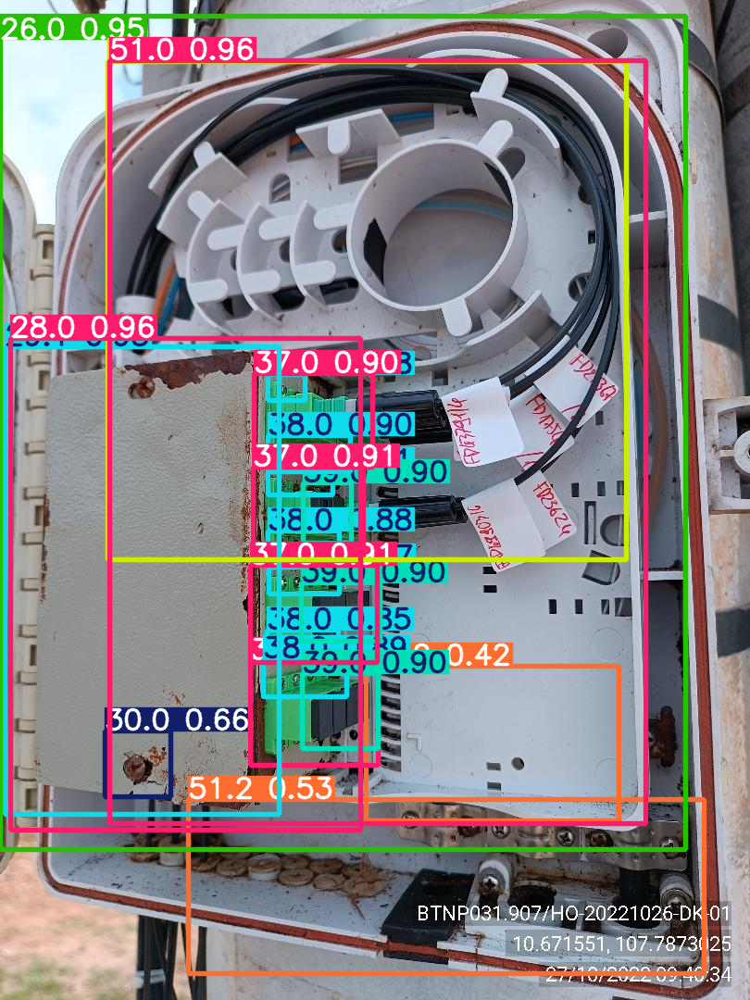

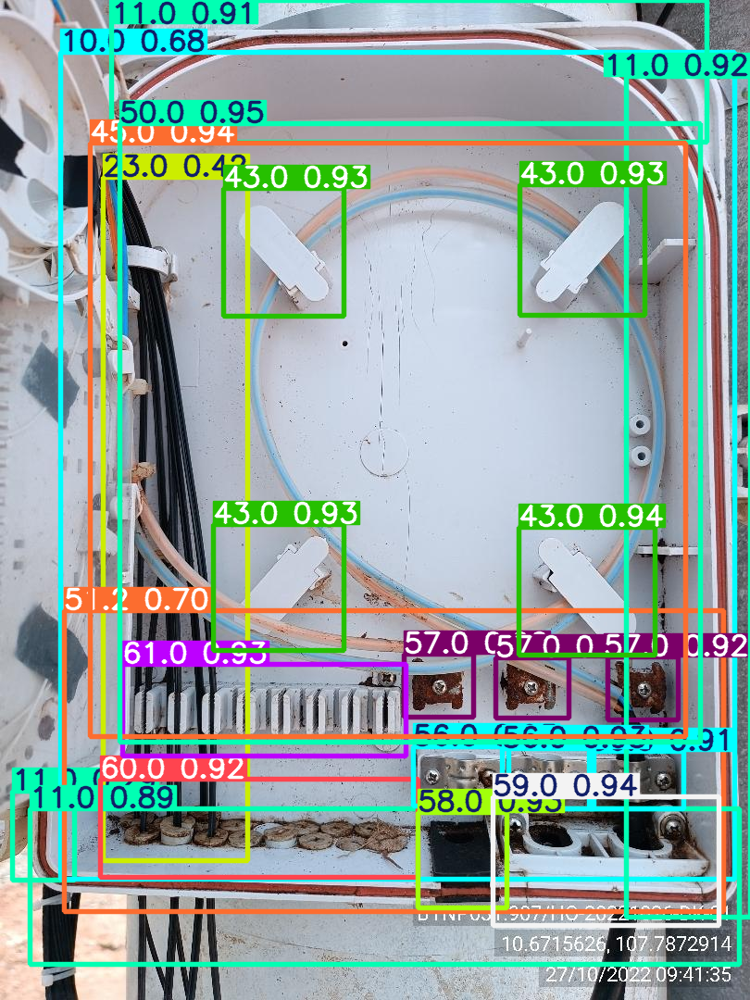

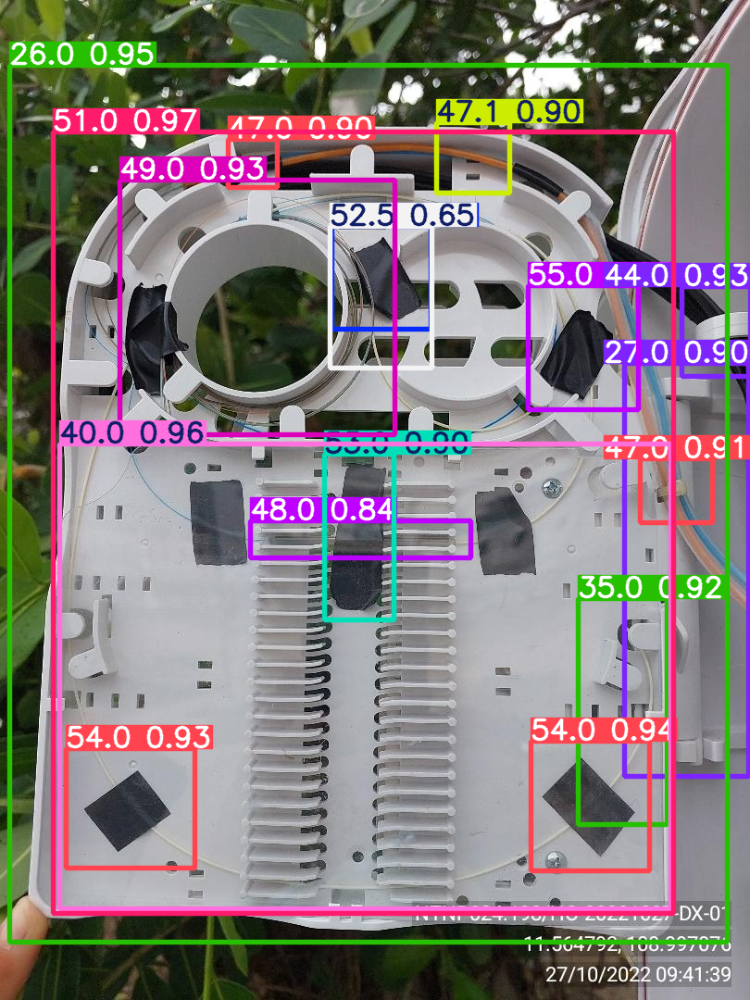

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO(yolo_aug_4_P40.get_best_weight_path())  # pretrained YOLO11n model

# Run batched inference on a list of images
results = model(test_lines[1:4])  # return a list of Results objects

# Process results list
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    result.save(filename="result.jpg")  # save to disk

In [ ]:
with open('/content/drive/MyDrive/fiber_optic_box_inspection/dataset_v2_ALL/test_P40.txt', 'r') as f:
    test_lines = f.readlines()
test_lines = [line.strip() for line in test_lines]

In [ ]:
with open('/content/dataset_v2_ALL/class_names_P40.txt', 'r') as f:
    class_names_P40 = f.readlines()
class_names_P40 = [name.strip() for name in class_names_P40]
# class_names_P40

['1.0',
 '1.1',
 '1.2',
 '',
 '1.7',
 '',
 '',
 '2.0',
 '',
 '',
 '3.0',
 '',
 '',
 '',
 '5.0',
 '',
 '6.0',
 '',
 '7.0',
 '',
 '',
 '',
 '',
 '',
 '8.0',
 '8.3',
 '',
 '',
 '9.0',
 '',
 '9.4',
 '',
 '10.0',
 '',
 '11.0',
 '11.1',
 '13.0',
 '',
 '',
 '',
 '',
 '14.0',
 '14.1',
 '14.2',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '19.0',
 '',
 '',
 '19.3',
 '',
 '',
 '20.0',
 '20.1',
 '20.2',
 '',
 '',
 '',
 '',
 '23.0',
 '23.1',
 '',
 '24.0',
 '24.1',
 '',
 '26.0',
 '',
 '27.0',
 '',
 '28.0',
 '',
 '',
 '29.0',
 '29.1',
 '',
 '',
 '30.0',
 '30.1',
 '32.0',
 '',
 '32.2',
 '',
 '',
 '',
 '',
 '35.0',
 '35.1',
 '',
 '',
 '37.0',
 '',
 '',
 '37.4',
 '38.0',
 '',
 '39.0',
 '',
 '40.0',
 '40.1',
 '',
 '41.0',
 '',
 '',
 '42.0',
 '',
 '43.0',
 '43.1',
 '44.0',
 '',
 '',
 '45.0',
 '45.1',
 '',
 '',
 '46.0',
 '46.1',
 '',
 '',
 '47.0',
 '47.1',
 '',
 '48.0',
 '',
 '49.0',
 '49.3',
 '49.4',
 '50.0',
 '50.1',
 '',
 '51.0',
 '51.2',
 '',
 '52.0',
 '52.3',
 '52.5',
 '53.0',
 '53.4',
 '53.5',

In [ ]:
def extract_data_from_label(label_path):
    class_labels, bboxes = [], []
    with open(label_path, 'r') as f:
        lines = f.readlines()

    for line in lines:
        (class_id, x_center, y_center, width, height) = line.strip().split(' ')
        class_labels.append(int(class_id))
        bboxes.append([float(x_center), float(y_center), float(width), float(height)])
    return class_labels, bboxes

In [ ]:
!rm -rf /content/output/
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import cv2
import numpy as np
import os
from datetime import datetime

# Load the YOLO model (e.g., YOLOv8 pre-trained model)
model = YOLO(yolo_aug_4_P40.get_best_weight_path())  # Use yolov8n.pt for lightweight model or replace with your custom-trained model

# Define paths
input_image_path = test_lines  # Directory with test images
output_dir = "/content/output"
os.makedirs(output_dir, exist_ok=True)

# Confidence and IoU thresholds defaults
conf_threshold = 0.7
iou_threshold = 0.7

# Function to process images and save results
def process_images(image_dir, output_dir):
    results_list = []

    for img_path in image_dir:
        img_name = Path(img_path).name
        img = cv2.imread(img_path)

        # Run YOLO prediction
        results = model(img, conf=conf_threshold, iou=iou_threshold, imgsz=960, device=0)

        # Extract predictions
        for result in results:
            boxes = result.boxes.xyxy.cpu().numpy()  # Bounding box coordinates
            confidences = result.boxes.conf.cpu().numpy()  # Confidence scores
            class_ids = result.boxes.cls.cpu().numpy()  # Class IDs
            class_names = result.names  # Class names

            # # Draw bounding boxes on image
            # annotated_img = img.copy()
            # for box, conf, cls_id in zip(boxes, confidences, class_ids):
            #     x1, y1, x2, y2 = map(int, box)
            #     label = f"{class_names[cls_id]} {conf:.2f}"
            #     color = (0, 255, 0)  # Green for true detections
            #     cv2.rectangle(annotated_img, (x1, y1), (x2, y2), color, 2)
            #     cv2.putText(annotated_img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

            # # Save annotated image
            # output_path = os.path.join(output_dir, f"annotated_{img_name}")
            # cv2.imwrite(output_path, annotated_img)

            # Store results for analysis
            results_list.append({
                'image_path': img_path,
                'boxes': boxes,
                'confidences': confidences,
                'class_ids': class_ids,
                'class_names': class_names,
                'image_shape' : img.shape
            })
    return results_list

# Function to evaluate results (requires ground truth annotations)
def evaluate_results(results_list, ground_truth_annotations):
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    for result in results_list:
        img_path = result['image_path']
        pred_boxes = result['boxes']
        pred_class_ids = result['class_ids']
        pred_confidences = result['confidences']
        class_names = result['class_names']
        h,w,_ = result['image_shape']


        # Load ground truth for the image (assuming ground truth in YOLO format)
        gt_boxes = ground_truth_annotations.get(img_path, [])
        gt_boxes = [
            {
                'box': [
                    (box['box'][0]-box['box'][2]/2)*w,
                     (box['box'][1]-box['box'][3]/2)*h,
                      (box['box'][0]+box['box'][2]/2)*w,
                       (box['box'][1]+box['box'][3]/2)*h],
                'class_id': box['class_id']
            } for box in gt_boxes]

        img = cv2.imread(img_path)
        annotated_img = img.copy()
        for gt_box in gt_boxes:
            x1, y1, x2, y2 = map(int, gt_box['box'])
            label = f"{gt_box['class_id']}"
            color = (255, 0, 0)  # blue for ground truth
            cv2.rectangle(annotated_img, (x1, y1), (x2, y2), color, 2)
            cv2.putText(annotated_img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)


        # Calculate IoU for each predicted box against ground truth
        for pred_box, pred_conf, pred_cls in zip(pred_boxes, pred_confidences, pred_class_ids):
            matched = False
            for gt_box in gt_boxes:
                iou = calculate_iou(pred_box, gt_box['box'])
                if iou > iou_threshold and pred_cls == gt_box['class_id']:
                    true_positives += 1
                    matched = True
                    # draw tru positive
                    x1, y1, x2, y2 = map(int, pred_box)
                    label = f"{pred_cls} {pred_conf:.2f}"
                    color = (0, 255, 0)
                    cv2.rectangle(annotated_img, (x1, y1), (x2, y2), color, 2)
                    cv2.putText(annotated_img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
                    break
            if not matched and pred_conf > conf_threshold:
                false_positives += 1
                # draw false
                x1, y1, x2, y2 = map(int, pred_box)
                label = f"{pred_cls} {pred_conf:.2f}"
                color = (0, 192, 255)  # yellow for false
                cv2.rectangle(annotated_img, (x1, y1), (x2, y2), color, 2)
                cv2.putText(annotated_img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

        # Check for missed detections (false negatives)
        for gt_box in gt_boxes:
            matched = False
            for pred_box, pred_conf, pred_cls in zip(pred_boxes, pred_confidences, pred_class_ids):
                # print(pred_cls, gt_box['class_id'])
                iou = calculate_iou(pred_box, gt_box['box'])
                if iou > iou_threshold and pred_cls == gt_box['class_id']:
                    matched = True
                    break
            if not matched:
                false_negatives += 1
                #draw
                x1, y1, x2, y2 = map(int, pred_box)
                label = f"{pred_cls} {pred_conf:.2f}"
                color = (192, 0, 255)   # pink for false negative
                cv2.rectangle(annotated_img, (x1, y1), (x2, y2), color, 2)
                cv2.putText(annotated_img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

        # Save annotated image
        # cv2_imshow(annotated_img)
        out_path = Path('/content/output', f"annotated_{Path(img_path).stem}.jpg")
        # print(out_path)
        cv2.imwrite(out_path, annotated_img)

    return true_positives, false_positives, false_negatives

# Function to calculate IoU
def calculate_iou(box1, box2):
    x1, y1, x2, y2 = box1
    x1_gt, y1_gt, x2_gt, y2_gt = box2

    # Calculate intersection
    xi1 = max(x1, x1_gt)
    yi1 = max(y1, y1_gt)
    xi2 = min(x2, x2_gt)
    yi2 = min(y2, y2_gt)

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)

    # Calculate union
    box1_area = (x2 - x1) * (y2 - y1)
    box2_area = (x2_gt - x1_gt) * (y2_gt - y1_gt)
    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area if union_area > 0 else 0

# Example ground truth annotations (replace with actual annotations)
ground_truth_annotations = {}
for test_line in test_lines:
    class_labels, bboxes = extract_data_from_label(Path(test_line).with_suffix('.txt'))

    ground_truth_annotations[test_line] = [
        {'box': box, 'class_id': class_id} for (box, class_id) in zip(bboxes, class_labels)
    ]

# Process images and evaluate
results_list = process_images(input_image_path, output_dir)
tp, fp, fn = evaluate_results(results_list, ground_truth_annotations)

# Save evaluation results to a text file
with open(os.path.join(output_dir, 'evaluation_results.txt'), 'w') as f:
    f.write(f"True Positives: {tp}\n")
    f.write(f"False Positives: {fp}\n")
    f.write(f"False Negatives: {fn}\n")
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f.write(f"Precision: {precision:.2f}\n")
    f.write(f"Recall: {recall:.2f}\n")
    if precision + recall > 0:
        f1_score = 2 * (precision * recall) / (precision + recall)
        f.write(f"F1 Score: {f1_score:.2f}\n")


0: 960x736 1 6.0, 1 7.0, 1 9.0, 1 14.2, 1 20.1, 11.7ms
Speed: 5.4ms preprocess, 11.7ms inference, 2.1ms postprocess per image at shape (1, 3, 960, 736)

0: 960x736 1 23.0, 1 26.0, 1 28.0, 1 29.1, 4 37.0s, 6 38.0s, 3 39.0s, 1 51.0, 10.9ms
Speed: 5.4ms preprocess, 10.9ms inference, 1.8ms postprocess per image at shape (1, 3, 960, 736)

0: 960x736 3 11.0s, 4 43.0s, 1 45.0, 1 50.0, 1 51.2, 3 56.0s, 3 57.0s, 1 58.0, 1 59.0, 1 60.0, 1 61.0, 10.4ms
Speed: 5.4ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 960, 736)

0: 960x736 1 26.0, 1 27.0, 1 35.0, 1 40.0, 1 44.0, 2 47.0s, 1 47.1, 1 48.0, 1 49.0, 1 51.0, 1 53.0, 2 54.0s, 1 55.0, 10.3ms
Speed: 5.2ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 960, 736)

0: 960x736 2 5.0s, 2 8.0s, 1 9.0, 11.3ms
Speed: 5.3ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 960, 736)

0: 960x736 1 26.0, 1 28.0, 1 29.0, 2 30.0s, 2 37.0s, 3 38.0s, 1 51.0, 10.6ms
Speed: 5.3ms prep

In [ ]:
results_list

[{'image_path': '/content/dataset_v2_ALL/image_label_P40/2022_10_27_09_40_00-BTNP031907HO.jpg',
  'boxes': array([[     200.72,      117.03,      347.19,      716.77],
         [      365.4,      301.05,      440.63,      670.68],
         [     240.29,       681.8,      659.76,      941.07],
         [     235.23,      690.64,      523.75,        1080],
         [     362.72,      137.58,      429.79,      201.66],
         [     238.32,      682.32,      661.38,      942.09],
         [     311.24,      180.18,         343,      221.22]], dtype=float32),
  'confidences': array([    0.91256,     0.88252,     0.80098,     0.78556,     0.70222,     0.49503,     0.27001], dtype=float32),
  'class_ids': array([         18,          16,          43,          61,          28,          41,          28], dtype=float32),
  'class_names': {0: '1.0',
   1: '1.1',
   2: '1.2',
   3: '',
   4: '1.7',
   5: '',
   6: '',
   7: '2.0',
   8: '',
   9: '',
   10: '3.0',
   11: '',
   12: '',
   13: ''

In [ ]:
!cat {Path(test_lines[0]).with_suffix('.txt')}

16 0.495679012345679 0.44999999999999996 0.07777777777777778 0.3685185185185185
18 0.3617283950617284 0.3949074074074074 0.2074074074074074 0.575
28 0.4955229175535689 0.1595093656875266 0.08024691358024691 0.05277777777777778
36 0.5461402015041863 0.7488612175393784 0.5049382716049383 0.2351851851851852
57 0.4813253866893714 0.8448009791400596 0.3308641975308642 0.31039804171988084


In [ ]:
!cat /content/output/evaluation_results.txt

True Positives: 9275
False Positives: 1537
False Negatives: 2153
Precision: 0.86
Recall: 0.81
F1 Score: 0.83


In [ ]:
!ls /content/dataset_v2_ALL/image_label_P40_aug_4/

2022_10_24_14_21_15-DNIP003390HO.jpg  2022_11_11_15_02_18-TNNP069042HO.txt
2022_10_24_14_21_15-DNIP003390HO.txt  2022_11_11_15_05_48-KGGP003269HO.jpg
2022_10_24_14_27_49-DNIP003388HO.jpg  2022_11_11_15_05_48-KGGP003269HO.txt
2022_10_24_14_27_49-DNIP003388HO.txt  2022_11_11_15_06_05-KGGP003269HO.jpg
2022_10_24_14_55_59-DNIP003392HO.jpg  2022_11_11_15_06_05-KGGP003269HO.txt
2022_10_24_14_55_59-DNIP003392HO.txt  2022_11_11_15_09_49-HNIP120041HO.jpg
2022_10_24_14_56_45-DNIP003392HO.jpg  2022_11_11_15_09_49-HNIP120041HO.txt
2022_10_24_14_56_45-DNIP003392HO.txt  2022_11_11_15_10_04-TQGP028126HO.jpg
2022_10_24_15_41_55-DNIP003390HO.jpg  2022_11_11_15_10_04-TQGP028126HO.txt
2022_10_24_15_41_55-DNIP003390HO.txt  2022_11_11_15_10_43-TQGP028126HO.jpg
2022_10_24_15_42_39-DNIP003390HO.jpg  2022_11_11_15_10_43-TQGP028126HO.txt
2022_10_24_15_42_39-DNIP003390HO.txt  2022_11_11_15_15_46-BTEP015175HO.jpg
2022_10_24_15_42_59-DNIP003390HO.jpg  2022_11_11_15_15_46-BTEP015175HO.txt
2022_10_24_15_42_59-DNIP0

In [ ]:
class_names_P40_map = {k:v for k,v in enumerate(class_names_P40)}

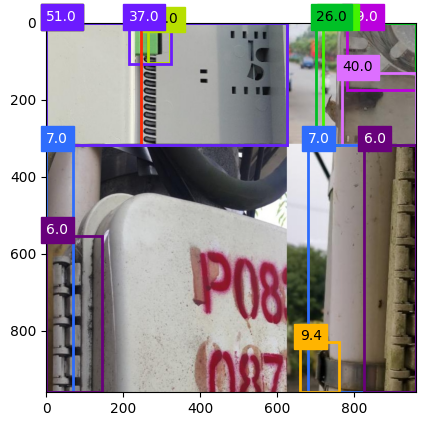

In [ ]:
from ultralytics.data.utils import visualize_image_annotations

# Visualize
visualize_image_annotations(
    "/content/dataset_v2_ALL/image_label_P40_aug_4/2022_11_08_09_00_29-TNNP083087HO.jpg",  # Input image path.
    "/content/dataset_v2_ALL/image_label_P40_aug_4/2022_11_08_09_00_29-TNNP083087HO.txt",  # Annotation file path for the image.
    class_names_P40_map,
)